In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
import numpy as np
from scipy.linalg import cholesky, solve, inv, sqrtm
from scipy.stats import multivariate_normal
import matplotlib.pyplot as plt
from typing import Tuple, List, Optional, Callable, Dict
import time
%matplotlib inline
%config InlineBackend.figure_format = 'svg'

In [4]:
import numba
from numba import jit, float64, int64, void, types, njit, prange, int32
import numpy as np
from numba.types import Array

### Параметры системы

In [5]:
# =====================================================
# 1. ПАРАМЕТРЫ СИСТЕМЫ И КОНСТАНТЫ
# =====================================================

# Параметры химической кинетики (делаем их глобальными константами для Numba)
K1 = 0.5
K2 = 0.05
K3 = 0.2
K4 = 0.01
RT_VAL = 32.84
R_VAL = 0.25**2


# Размерность состояния
N = 3  # cA, cB, cC

# Начальное состояние (истинное)
x0_true = np.array([0.5, 0.05, 0.0])

# Начальные условия для фильтров
x0_filter = x0_true
P0 = np.diag([0.5**2, 0.5**2, 0.5**2])

# Параметры измерений
RT = 32.84
R = 0.25**2
G = np.eye(3)


# Временные параметры
delta1 = 1e-5
delta2 = 0.001
delta3 = 0.25
dt = delta2
T_total = 20.0

# =====================================================
# 2. ФУНКЦИИ ХИМИЧЕСКОЙ СИСТЕМЫ (оптимизированные с Numba)
# =====================================================

@jit(nopython=True)
def reaction_rates_numba(cA: float, cB: float, cC: float) -> Tuple[float, float]:
    """Скорости химических реакций - оптимизированная версия"""
    # Защита от отрицательных значений и переполнения
    cA = max(cA, 1e-10)
    cB = max(cB, 1e-10)
    cC = max(cC, 1e-10)

    r1 = K1 * cA - K2 * cB * cC
    r2 = K3 * cB * cB - K4 * cC  # Используем умножение вместо **2
    return r1, r2

@jit(nopython=True)
def drift_function_numba(x: np.ndarray) -> np.ndarray:
    """Функция дрейфа f(x) - оптимизированная версия"""
    cA, cB, cC = x[0], x[1], x[2]

    # Вычисляем скорости реакций
    r1, r2 = reaction_rates_numba(cA, cB, cC)

    # Стехиометрическая матрица (заранее известна)
    # nu = [[-1, 1, 1], [0, -2, 1]]
    # nu.T @ r = [-1*r1 + 0*r2, 1*r1 - 2*r2, 1*r1 + 1*r2]

    # Вычисляем результат напрямую (оптимизация умножения матриц)
    result = np.zeros(3)
    result[0] = -r1  # -1*r1
    result[1] = r1 - 2.0 * r2  # 1*r1 - 2*r2
    result[2] = r1 + r2  # 1*r1 + 1*r2

    # Защита от слишком больших значений
    max_drift = 10.0 / 0.001  # dt будет передаваться отдельно
    for i in range(3):
        if result[i] > max_drift:
            result[i] = max_drift
        elif result[i] < -max_drift:
            result[i] = -max_drift

    return result

@jit(nopython=True)
def measurement_function_numba(x: np.ndarray) -> float:
    """Функция измерений h(x) - оптимизированная версия"""
    # RT * sum(x)
    total = 0.0
    for i in range(3):
        val = x[i]
        if val < 0.0:
            val = 0.0
        elif val > 1e10:
            val = 1e10
        total += val
    return RT_VAL * total

@jit(nopython=True)
def process_noise_covariance_numba(delta: float, delta1: float) -> np.ndarray:
    """Ковариация шума процесса - оптимизированная версия"""
    q_val = 1e-6 / 1e-5
    cov = np.zeros((3, 3))
    value = q_val * delta
    cov[0, 0] = value
    cov[1, 1] = value
    cov[2, 2] = value
    return cov

# =====================================================
# ОБЕРТКИ ДЛЯ СОВМЕСТИМОСТИ С ОРИГИНАЛЬНЫМ КОДОМ
# =====================================================

def reaction_rates(c: np.ndarray) -> np.ndarray:
    """Обертка для совместимости"""
    r1, r2 = reaction_rates_numba(c[0], c[1], c[2])
    return np.array([r1, r2])

def drift_function(x: np.ndarray) -> np.ndarray:
    """Обертка для совместимости"""
    return drift_function_numba(x)

def measurement_function(x: np.ndarray) -> float:
    """Обертка для совместимости"""
    return measurement_function_numba(x)

def process_noise_covariance(delta: float) -> np.ndarray:
    """Обертка для совместимости"""
    return process_noise_covariance_numba(delta1, delta2)


### Моделирование траектории

In [6]:
# =====================================================
# 3. МОДЕЛИРОВАНИЕ ИСТИННОЙ ТРАЕКТОРИИ
# =====================================================

@jit(nopython=True)
def simulate_true_trajectory_numba(
    initial_state: np.ndarray,
    T_total: float,
    delta1: float,
    delta2: float,
    delta3: float,
    R: float
) -> Tuple[np.ndarray, np.ndarray, np.ndarray]:
    """
    Моделирование истинной траектории - оптимизированная версия
    """
    n_steps = int(T_total / delta1) + 1
    true_states = np.zeros((n_steps, 3))
    true_states[0] = initial_state

    # Предвычисляем квадратный корень из delta1
    sqrt_delta1 = np.sqrt(delta1)

    # Ковариация шума процесса
    Q_delta1 = process_noise_covariance_numba(delta2, delta1)
    # Разложение Холецкого (простая версия для диагональной матрицы)
    Q_sqrt = np.zeros((3, 3))
    for i in range(3):
        Q_sqrt[i, i] = np.sqrt(Q_delta1[i, i])

    # Главный цикл моделирования
    for i in range(1, n_steps):
        x_prev = true_states[i-1]

        # Детерминированная часть
        f_val = drift_function_numba(x_prev)

        # Стохастическая часть
        dw = np.zeros(3)
        for j in range(3):
            dw[j] = sqrt_delta1 * Q_sqrt[j, j] * np.random.randn()

        # Обновление состояния
        new_state = np.zeros(3)
        for j in range(3):
            new_val = x_prev[j] + f_val[j] * delta1 + dw[j]
            new_state[j] = max(new_val, 1e-10)

        true_states[i] = new_state

    # Генерация измерений в моменты delta3
    measurement_interval = int(delta3 / delta2)
    n_measurements = n_steps // measurement_interval
    measurements = np.zeros(n_measurements)

    for i in range(n_measurements):
        idx = i * measurement_interval
        measurement = measurement_function_numba(true_states[idx]) + np.sqrt(R) * np.random.randn()
        measurements[i] = measurement

    # Индексы измерений
    measurement_indices = np.arange(0, n_measurements * measurement_interval, measurement_interval)

    return true_states, measurements, measurement_indices


def simulate_true_trajectory(initial_state: np.ndarray, delta1: float = 0.001) -> Tuple[np.ndarray, np.ndarray, np.ndarray, np.ndarray, list]:
    """Обертка для совместимости"""

    true_states, measurements, measurement_indices = simulate_true_trajectory_numba(
        initial_state, T_total, delta1, delta2, delta3, R
    )
    return true_states, measurements, measurement_indices

### Тривиальный

In [7]:
def trivial_estimation(n_trajectories: int = 10) -> Tuple[np.ndarray, np.ndarray]:
    total_steps = int(T_total / delta2) + 1

    all_trajectories = np.zeros((n_trajectories, total_steps, 3))
    for i in range(n_trajectories):
        x0_i = x0_filter

        states_i, _, _ = simulate_true_trajectory(
            delta1=delta2,
            initial_state=x0_i
        )
        if len(states_i) > total_steps:
            states_i = states_i[:total_steps]
        elif len(states_i) < total_steps:
            last_state = states_i[-1]
            padding = np.tile(last_state, (total_steps - len(states_i), 1))
            states_i = np.vstack([states_i, padding])

        all_trajectories[i] = states_i
    trivial_states = np.mean(all_trajectories, axis=0)
    trivial_stds = np.std(all_trajectories, axis=0)

    return trivial_states, trivial_stds

### UKF

In [128]:
import numba
from numba import jit, float64, int64, void, types, njit, prange, int32
import numpy as np
from numba.types import Array
# =====================================================
# 4. UKF (СИГМА-ТОЧЕЧНЫЙ ФИЛЬТР КАЛМАНА)
# =====================================================

# Параметры UKF
ALPHA = 1.0
BETA = 2.0
KAPPA = 0.0
N = 3
LAMBDA = ALPHA**2 * (N + KAPPA) - N
GAMMA = np.sqrt(N + LAMBDA)

# Предварительный расчет весов
WM_0 = LAMBDA / (N + LAMBDA)
WC_0 = WM_0 + (1 - ALPHA**2 + BETA)
WM_I = 1 / (2 * (N + LAMBDA))
WC_I = 1 / (2 * (N + LAMBDA))

# Векторы весов
WM = np.zeros(2*N + 1)
WC = np.zeros(2*N + 1)
WM[0] = WM_0
WC[0] = WC_0
WM[1:] = WM_I
WC[1:] = WC_I

def compute_sigma_points(x: np.ndarray, P: np.ndarray) -> np.ndarray:
    """
    Вычисление сигма-точек
    """
    N = len(x)

    # Стабилизация матрицы
    P_sym = 0.5 * (P + P.T)
    P_sym = P_sym + 1e-8 * np.eye(N)

    # Разложение Холецкого
    try:
        S = cholesky(P_sym, lower=True)
    except:
        S = np.real(sqrtm(P_sym))

    x_expanded = x[np.newaxis, :]
    sigma_points = np.vstack([
        x_expanded,
        x_expanded + GAMMA * S.T,
        x_expanded - GAMMA * S.T
    ])

    return sigma_points

def predict_step(x: np.ndarray, P: np.ndarray) -> Tuple[np.ndarray, np.ndarray]:
    """
    Шаг прогноза UKF
    """
    # Вычисление сигма-точек
    sigma_points = compute_sigma_points(x, P)

    # Прогноз каждой сигма-точки
    sigma_points_pred = np.zeros_like(sigma_points)
    for i in range(len(sigma_points)):
        drift = drift_function(sigma_points[i])
        sigma_points_pred[i] = sigma_points[i] + drift * dt

    # Вычисление среднего
    x_pred = np.sum(WM[:, np.newaxis] * sigma_points_pred, axis=0)

    # Вычисление ковариации
    P_pred = np.zeros((N, N))
    for i in range(len(sigma_points_pred)):
        diff = sigma_points_pred[i] - x_pred
        P_pred += WC[i] * np.outer(diff, diff)

    Q = process_noise_covariance(dt)*0.01
    P_pred += Q

    P_pred = 0.5 * (P_pred + P_pred.T)  # Делаем симметричной

    x_pred = np.maximum(x_pred, 1e-10)
    return x_pred, P_pred

def update_step(x_pred: np.ndarray, P_pred: np.ndarray, y_meas: float) -> Tuple[np.ndarray, np.ndarray]:
    """
    Шаг коррекции UKF
    """
    # Вычисление сигма-точек
    sigma_points_pred = compute_sigma_points(x_pred, P_pred)

    # Преобразование сигма-точек через функцию измерений
    # Изменено: Применяем measurement_function_numba к каждой сигма-точке отдельно
    z_sigma = np.zeros(len(sigma_points_pred))
    for i in range(len(sigma_points_pred)):
        z_sigma[i] = measurement_function_numba(sigma_points_pred[i])

    # Прогноз измерения
    y_pred = np.sum(WM * z_sigma)

    # 4. Вычисление ковариаций
    Pyy = np.sum(WC * (z_sigma - y_pred)**2) + R

    Pxy = np.zeros(N)
    for i in range(len(sigma_points_pred)):
        Pxy += WC[i] * (sigma_points_pred[i] - x_pred) * (z_sigma[i] - y_pred)

    if Pyy <= 0:
        Pyy = 1e-8

    # Вычисление коэффициента Калмана
    K = Pxy / Pyy

    # Коррекция
    innovation = y_meas - y_pred
    x_corr = x_pred + K * innovation

    # Стабилизация матрицы ковариаций
    P_corr = P_pred -  np.outer(K, K) * Pyy
    P_corr = 0.5 * (P_corr + P_corr.T)
    P_corr = P_corr + 1e-8 * np.eye(N)


    x_corr = np.maximum(x_corr, 1e-10)
    return x_corr, P_corr

def ukf_filter(measurements, measurement_indices):
    """
    UKF фильтрация
    """

    total_steps = int(T_total / delta2) + 1
    bebra = int(delta3/delta2)

    # Инициализация выходных массивов
    estimated_states = np.zeros((total_steps, 3))
    estimated_stds = np.zeros((total_steps, 3))

    # Инициализация фильтра
    current_state = x0_filter.copy()
    current_cov = P0.copy()

    estimated_states[0] = current_state
    estimated_stds[0] = np.sqrt(np.diag(current_cov))

    meas_index = 0
    total_measurements = len(measurements)

    for step in range(1, total_steps):
        # Прогноз без коррекции
        state_pred, cov_pred = predict_step(current_state, current_cov)

        # Прогноз с измерением
        if (step % bebra == 0) and (meas_index < total_measurements):
            measurement = measurements[meas_index]

            # Коррекция
            state_corr, cov_corr = update_step(state_pred, cov_pred, measurement)

            # Обновление состояния
            current_state = state_corr.copy()
            current_cov = cov_corr.copy()
            meas_index += 1
        else:
            current_state = state_pred.copy()
            current_cov = cov_pred.copy()

        # Сохранение
        estimated_states[step] = current_state

        variances = np.diag(current_cov)
        variances = np.maximum(variances, 0)
        estimated_stds[step] = np.sqrt(variances)

    print(f"UKF фильтрация завершена. Использовано {meas_index} из {total_measurements} измерений.")

    return estimated_states, estimated_stds

### PF

In [129]:
N_PARTICLES = 1000
Q_SCALE_FACTOR = 10000
RESAMPLING_THRESHOLD = 0.5


def measurement_function_1d(x: np.ndarray) -> float:
    """Функция измерений h(x)"""
    return RT * np.sum(np.clip(x, 0.0, 1e10))

@njit
def get_q_val(dt):
    return (1e-6*Q_SCALE_FACTOR) / delta3 * dt

@njit('float64(float64[:])', fastmath=True)
def measurement_function_1d(x):
    """Функция измерений h(x) - одномерная"""
    total = 0.0
    for i in range(3):
        total += max(x[i], 0.0)
    return RT * total

@njit('float64[:](float64[:])', fastmath=True)
def drift_function_numba(x):
    """Ускоренная функция дрейфа"""
    cA, cB, cC = x[0], x[1], x[2]

    cA = max(cA, 1e-10)
    cB = max(cB, 1e-10)
    cC = max(cC, 1e-10)

    r1 = K1 * cA - K2 * cB * cC
    r2 = K3 * cB**2 - K4 * cC

    nu_T = np.array([[-1.0, 0.0],
                     [1.0, -2.0],
                     [1.0, 1.0]])

    result = np.zeros(3)
    for i in range(3):
        result[i] = nu_T[i, 0] * r1 + nu_T[i, 1] * r2

    return result

@njit('float64[:](float64[:], float64)', fastmath=True)
def deterministic_propagation_numba(particle, dt):
    """Детерминированный прогноз частицы"""
    drift = drift_function_numba(particle)
    predicted = particle + drift * dt

    for i in range(3):
        if predicted[i] < 1e-10:
            predicted[i] = 1e-10

    return predicted

@njit('(float64[:], float64, float64)', fastmath=True)
def compute_optimal_params_numba(m_f, y_meas, dt):
    """
    Оптимальное предложение по UKF-подобной формуле
    Возвращает mu_opt, Sigma_opt
    """
    q_val = get_q_val(dt)

    # H = [RT, RT, RT]
    H = np.array([RT, RT, RT])

    # Q - ковариация шума
    Q = np.eye(3) * q_val

    # S = H @ Q @ H.T + R
    S = 3.0 * RT * RT * q_val + R

    # K = Q @ H.T / S
    K = np.zeros(3)
    scale = q_val * RT / S
    for i in range(3):
        K[i] = scale

    # Прогноз
    y_pred = RT * (m_f[0] + m_f[1] + m_f[2])

    # Оптимальное среднее
    innov = y_meas - y_pred
    mu_opt = m_f + K * innov

    # Sigma_opt = Q - K @ (H @ Q)
    Sigma_opt = np.zeros((3, 3))
    for i in range(3):
        for j in range(3):
            Sigma_opt[i, j] = Q[i, j] - K[i] * H[j] * q_val

    for i in range(3):
        for j in range(i+1, 3):
            avg = 0.5 * (Sigma_opt[i, j] + Sigma_opt[j, i])
            Sigma_opt[i, j] = avg
            Sigma_opt[j, i] = avg

    for i in range(3):
        Sigma_opt[i, i] = max(Sigma_opt[i, i], 1e-12)

    return mu_opt, Sigma_opt

@njit('float64(float64[:], float64, float64)', fastmath=True)
def compute_log_likelihood_numba(m_f, y_meas, dt):
    """Логарифм правдоподобия измерения"""
    q_val = get_q_val(dt)

    # S = H @ Q @ H.T + R
    S = 3.0 * RT * RT * q_val + R

    # Прогноз
    y_pred = RT * (m_f[0] + m_f[1] + m_f[2])

    innov = y_meas - y_pred
    exponent = -0.5 * innov * innov / S
    log_like = exponent - 0.5 * np.log(2.0 * np.pi * S)

    return log_like

@njit('(float64[:, :], float64[:], boolean, float64, float64)',
      parallel=True, fastmath=True)
def pf_filter_step_opt_numba(particles, weights, has_measurement, measurement, dt):
    """Шаг фильтра частиц с оптимальным предложением"""
    N = particles.shape[0]
    new_particles = np.zeros_like(particles)
    log_weights = np.zeros(N)

    if has_measurement:
        for i in prange(N):
            m_f = deterministic_propagation_numba(particles[i], dt)

            mu_opt, Sigma_opt = compute_optimal_params_numba(m_f, measurement, dt)

            L = np.zeros((3, 3))
            for j in range(3):
                L[j, j] = np.sqrt(max(Sigma_opt[j, j], 1e-12))

            z = np.random.randn(3)
            x_new = mu_opt.copy()
            for j in range(3):
                x_new[j] += L[j, j] * z[j]

            for j in range(3):
                if x_new[j] < 1e-10:
                    x_new[j] = 1e-10

            new_particles[i] = x_new

            # Обновление веса
            log_lik = compute_log_likelihood_numba(m_f, measurement, dt)
            log_weights[i] = np.log(max(weights[i], 1e-300)) + log_lik

        # Нормализация весов
        max_log = np.max(log_weights)
        log_weights -= max_log
        weights_temp = np.exp(log_weights)
        sum_weights = np.sum(weights_temp)

        if sum_weights > 0:
            new_weights = weights_temp / sum_weights
        else:
            new_weights = np.ones(N) / N

        return new_particles, new_weights

    else:
        # Без измерения - только прогноз
        for i in prange(N):
            new_particles[i] = deterministic_propagation_numba(particles[i], dt)

        return new_particles, weights.copy()

@njit('float64(float64[:])', fastmath=True)
def effective_sample_size_numba(weights):
    """Вычисление эффективного размера выборки"""
    sum_sq = 0.0
    for i in range(len(weights)):
        sum_sq += weights[i] * weights[i]
    return 1.0 / sum_sq if sum_sq > 0 else 0.0

@njit('(float64[:, :], float64[:], float64)', fastmath=True)
def systematic_resample_with_jitter_numba(particles, weights, jitter_factor=0.1):
    """Систематическая перевыборка с регуляризацией"""
    N = len(particles)

    cum_weights = np.zeros(N)
    cum_sum = 0.0
    for i in range(N):
        cum_sum += weights[i]
        cum_weights[i] = cum_sum

    points = np.zeros(N)
    start = np.random.uniform(0, 1.0/N)
    for i in range(N):
        points[i] = start + i * (1.0/N)

    indices = np.zeros(N, dtype=np.int64)
    i_idx, j_idx = 0, 0
    while i_idx < N:
        if points[i_idx] < cum_weights[j_idx]:
            indices[i_idx] = j_idx
            i_idx += 1
        else:
            j_idx += 1

    resampled = np.zeros_like(particles)
    for i in range(N):
        resampled[i] = particles[indices[i]]

    if jitter_factor > 0:
        std_particles = np.zeros(3)
        for j in range(3):
            mean = 0.0
            for i in range(N):
                mean += resampled[i, j]
            mean /= N

            var = 0.0
            for i in range(N):
                diff = resampled[i, j] - mean
                var += diff * diff
            std_particles[j] = np.sqrt(var / (N - 1)) if N > 1 else 0.0

        for i in range(N):
            for j in range(3):
                if std_particles[j] > 0:
                    resampled[i, j] += jitter_factor * std_particles[j] * np.random.randn()
                if resampled[i, j] < 1e-10:
                    resampled[i, j] = 1e-10

    new_weights = np.ones(N) / N
    return resampled, new_weights

@njit('(float64[:, :], float64[:])', fastmath=True)
def estimate_state_from_particles_opt_numba(particles, weights):
    """Оценка состояния и ковариации из частиц"""
    N = len(particles)

    x_est = np.zeros(3)
    for i in range(N):
        for j in range(3):
            x_est[j] += weights[i] * particles[i, j]

    P_est = np.zeros((3, 3))
    for i in range(N):
        diff = particles[i] - x_est
        for j in range(3):
            for k in range(3):
                P_est[j, k] += weights[i] * diff[j] * diff[k]

    for j in range(3):
        for k in range(j+1, 3):
            avg = 0.5 * (P_est[j, k] + P_est[k, j])
            P_est[j, k] = avg
            P_est[k, j] = avg

    # Регуляризация
    trace_P = P_est[0, 0] + P_est[1, 1] + P_est[2, 2]
    alpha = 0.01
    for j in range(3):
        P_est[j, j] = max(P_est[j, j], alpha * trace_P / 3)

    # Стандартные отклонения
    std_est = np.zeros(3)
    for j in range(3):
        std_est[j] = np.sqrt(max(P_est[j, j], 1e-12))

    return x_est, std_est, P_est

def init_particles_opt():
    """
    Улучшенная инициализация частиц
    """
    # Начальная ковариация
    cov = np.diag([0.05, 0.05, 0.05])**2

    # Генерация частиц
    particles = np.random.multivariate_normal(x0_filter, cov, N_PARTICLES)
    particles = np.maximum(particles, 1e-10)

    weights = np.ones(N_PARTICLES) / N_PARTICLES

    return particles, weights

def pf_filter_opt(measurements: np.ndarray, measurement_indices: list):
    """
    Улучшенный фильтр частиц с оптимальным предложением
    """
    total_steps = int(T_total / delta2) + 1
    bebra = int(delta3 / delta2)

    # Выходные массивы
    estimated_states = np.zeros((total_steps, 3))
    estimated_stds = np.zeros((total_steps, 3))

    # Инициализация
    particles, weights = init_particles_opt()

    # Начальная оценка
    # нужно изменить чтобы совпадали в нуле
    x_est, std_est, P_est = estimate_state_from_particles_opt_numba(particles, weights)
    x_est = x0_filter
    estimated_states[0] = x_est
    estimated_stds[0] = std_est

    meas_index = 0
    total_measurements = len(measurements)

    for step in range(1, total_steps):
        # Есть ли измерение на этом шаге
        has_measurement = (step % bebra == 0) and (meas_index < total_measurements) and (step != 0)
        measurement = measurements[meas_index] if has_measurement else 0.0

        # Шаг фильтра частиц
        particles, weights = pf_filter_step_opt_numba(
            particles, weights, has_measurement, measurement, delta2
        )

        if has_measurement:
            meas_index += 1

        # Перевыборка
        Neff = effective_sample_size_numba(weights)
        if Neff < N_PARTICLES * RESAMPLING_THRESHOLD:
            particles, weights = systematic_resample_with_jitter_numba(
                particles, weights, jitter_factor=0.05
            )

        # Оценка состояния из частиц
        x_est, std_est, P_est = estimate_state_from_particles_opt_numba(particles, weights)

        # Сохранение
        estimated_states[step] = x_est
        estimated_stds[step] = std_est

        # Вывод прогресса
        """
        if step % 5000 == 0:
            print(f"PF: Шаг {step}/{total_steps-1}, "
                  f"Neff = {Neff:.1f}, "
                  f"Использовано измерений: {meas_index}/{total_measurements}")
    """
    print(f"PF фильтрация завершена. Использовано {meas_index} из {total_measurements} измерений.")

    return estimated_states, estimated_stds

### Результаты одной траектории

In [130]:
x0_true = np.array([0.5, 0.05, 0.0])
x0_filter = x0_true
P0 = np.diag([0.03**2, 0.03**2, 0.03**2])
N_PARTICLES = 300
RESAMPLING_THRESHOLD = 0.5
Q_SCALE_FACTOR = 1000
delta1 = 1e-5
delta2 = 0.001
delta3 = 0.25
dt = delta2
T_total = 20.0

In [131]:
true_states, measurements, measurement_indices = simulate_true_trajectory(x0_true, delta2)
print(f"Последнее состояние: {true_states[-1]}")

Последнее состояние: [0.00403663 0.20524043 0.72388173]


In [132]:
trivial_states, trivial_stds = trivial_estimation(n_trajectories = 500)

In [133]:
ukf_states, ukf_stds = ukf_filter(measurements, measurement_indices)

print("=" * 50)
print("UKF Results:")
print(f"  Final state: {ukf_states[-1]}")
print(f"  Final true state: {true_states[-1]}")
print(f"  Final stds: {ukf_stds[-1]}")
print(f"  Final error: {np.abs(ukf_states[-1]-true_states[-1])}")
print(f"  Shape of estimated_states: {ukf_states.shape}")
print(f"  Shape of estimated_stds: {ukf_stds.shape}")
print("=" * 50)

UKF фильтрация завершена. Использовано 80 из 80 измерений.
UKF Results:
  Final state: [0.01481573 0.21190509 0.71552207]
  Final true state: [0.00403663 0.20524043 0.72388173]
  Final stds: [0.00350228 0.00594275 0.00663487]
  Final error: [0.0107791  0.00666466 0.00835967]
  Shape of estimated_states: (20001, 3)
  Shape of estimated_stds: (20001, 3)


In [134]:
pf_states, pf_stds = pf_filter_opt(measurements, measurement_indices)

print("=" * 50)
print("PF Results:")
print(f"  Final state: {pf_states[-1]}")
print(f"  Final true state: {true_states[-1]}")
print(f"  Final stds: {pf_stds[-1]}")
print(f"  Final error: {np.abs(pf_states[-1]-true_states[-1])}")
print(f"  Shape of estimated_states: {pf_states.shape}")
print(f"  Shape of estimated_stds: {pf_stds.shape}")
print("=" * 50)

PF фильтрация завершена. Использовано 80 из 80 измерений.
PF Results:
  Final state: [0.01532585 0.20977839 0.71812664]
  Final true state: [0.00403663 0.20524043 0.72388173]
  Final stds: [0.00880267 0.01377325 0.01519672]
  Final error: [0.01128922 0.00453795 0.00575509]
  Shape of estimated_states: (20001, 3)
  Shape of estimated_stds: (20001, 3)


In [22]:
time = np.linspace(0, T_total, int(T_total/(delta2))+1)

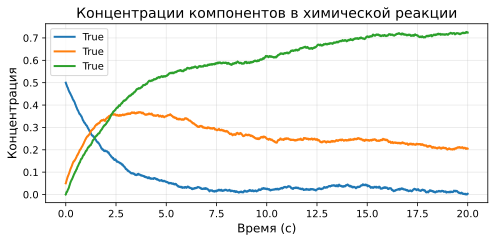

In [135]:
plt.figure(figsize=(7, 3.5))
plt.plot(time, true_states,label = 'True', alpha=1, linewidth=2)
#plt.plot(time, ukf_states,label = 'Predict', alpha=0.7, linewidth=2,linestyle='--')
plt.xlabel('Время (с)', fontsize=12)
plt.ylabel('Концентрация', fontsize=12)
plt.title('Концентрации компонентов в химической реакции', fontsize=14)
plt.legend()
plt.grid(alpha=0.3)
#plt.ylim((-1,1))
plt.tight_layout()
plt.show()

In [136]:
A4_WIDTH = 11.69  # дюймов
A4_HEIGHT = 8.27   # дюймов
DPI = 400

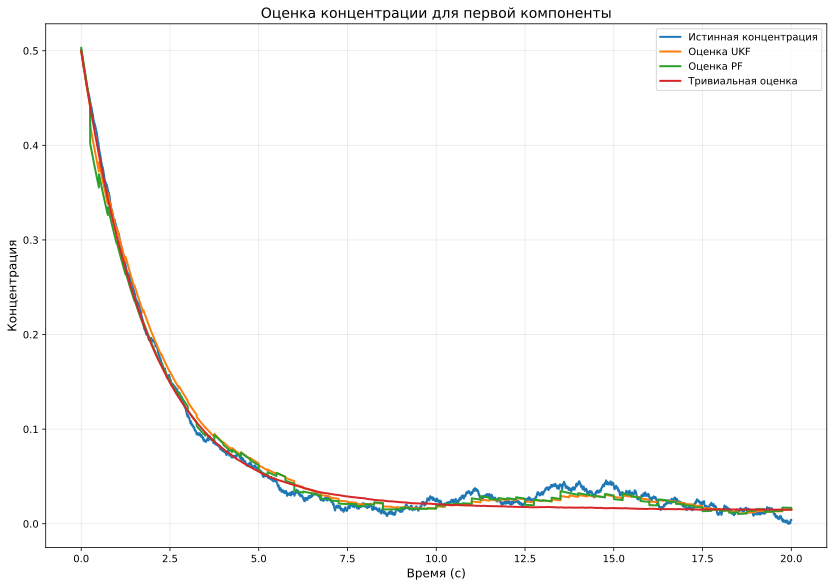

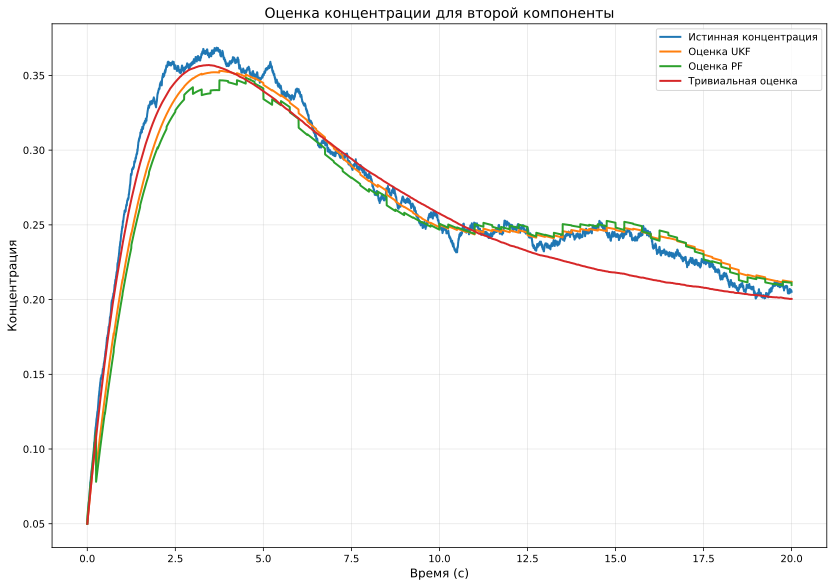

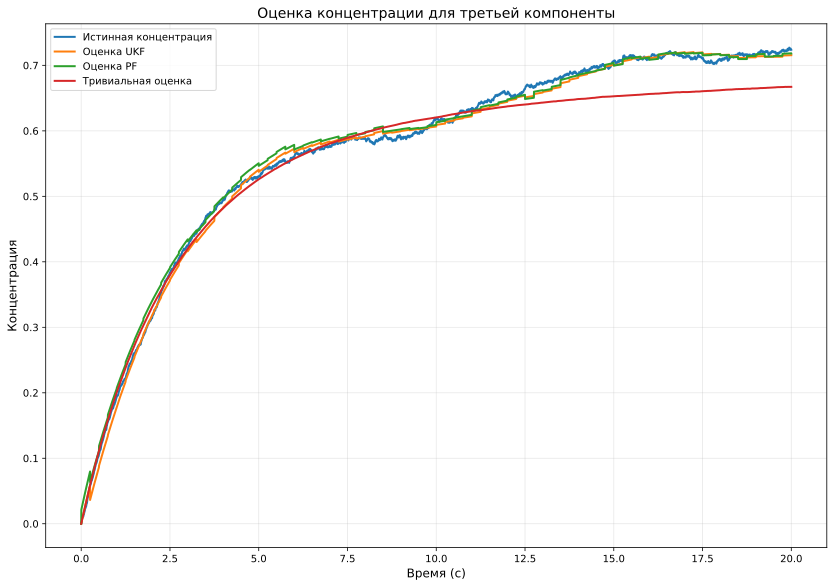

In [137]:
plt.figure(figsize=(A4_WIDTH, A4_HEIGHT), dpi=DPI)

plt.plot(time, true_states[:, 0],label = 'Истинная концентрация', alpha=1, linewidth=2)
plt.plot(time, ukf_states[:, 0],label = 'Оценка UKF', alpha=1, linewidth=2,linestyle='-')
plt.plot(time, pf_states[:, 0],label = 'Оценка PF', alpha=1, linewidth=2,linestyle='-')
plt.plot(time, trivial_states[:, 0],label = 'Тривиальная оценка', alpha=1, linewidth=2,linestyle='-')
plt.xlabel('Время (с)', fontsize=12)
plt.ylabel('Концентрация', fontsize=12)
plt.title('Оценка концентрации для первой компоненты', fontsize=14)
plt.legend()
plt.grid(alpha=0.3)
#plt.ylim((-1,1))
plt.tight_layout()

plt.show()

plt.figure(figsize=(A4_WIDTH, A4_HEIGHT), dpi=DPI)

plt.plot(time, true_states[:, 1],label = 'Истинная концентрация', alpha=1, linewidth=2)
plt.plot(time, ukf_states[:, 1],label = 'Оценка UKF', alpha=1, linewidth=2,linestyle='-')
plt.plot(time, pf_states[:, 1],label = 'Оценка PF', alpha=1, linewidth=2,linestyle='-')
plt.plot(time, trivial_states[:, 1],label = 'Тривиальная оценка', alpha=1, linewidth=2,linestyle='-')
plt.xlabel('Время (с)', fontsize=12)
plt.ylabel('Концентрация', fontsize=12)
plt.title('Оценка концентрации для второй компоненты', fontsize=14)
plt.legend()
plt.grid(alpha=0.3)
#plt.ylim((-1,1))
plt.tight_layout()


plt.show()

plt.figure(figsize=(A4_WIDTH, A4_HEIGHT), dpi=DPI)

plt.plot(time, true_states[:, 2],label = 'Истинная концентрация', alpha=1, linewidth=2)
plt.plot(time, ukf_states[:, 2],label = 'Оценка UKF', alpha=1, linewidth=2,linestyle='-')
plt.plot(time, pf_states[:, 2],label = 'Оценка PF', alpha=1, linewidth=2,linestyle='-')
plt.plot(time, trivial_states[:, 2],label = 'Тривиальная оценка', alpha=1, linewidth=2,linestyle='-')
plt.xlabel('Время (с)', fontsize=12)
plt.ylabel('Концентрация', fontsize=12)
plt.title('Оценка концентрации для третьей компоненты', fontsize=14)
plt.legend()
plt.grid(alpha=0.3)
#plt.ylim((-1,1))
plt.tight_layout()


plt.show()

In [138]:
time = np.linspace(0, T_total, int(T_total/delta2)+1)
# Построение графика
plt.figure(figsize=(A4_WIDTH, A4_HEIGHT), dpi=DPI)

plt.plot(time, true_states[:, 0] - ukf_states[:, 0],label = 'Ошибка UKF', alpha=1, linewidth=2,linestyle='-')
plt.plot(time, true_states[:, 0] - pf_states[:, 0],label = 'Ошибка PF', alpha=1, linewidth=2,linestyle='-')
plt.plot(time, true_states[:, 0] - trivial_states[:, 0],label = 'Ошибка тривиальной оценка', alpha=1, linewidth=2,linestyle='-')

plt.fill_between(time,
                 -3 * ukf_stds[:, 0],
                 3 * ukf_stds[:, 0],
                 color='blue', alpha=0.1, label='±3σ UKF')

# PF: ±3σ
plt.fill_between(time,
                 -3 * pf_stds[:, 0],
                 3 * pf_stds[:, 0],
                 color='red', alpha=0.1, label='±3σ PF')

plt.fill_between(time,
                 -3 * trivial_stds[:, 0],
                 3 * trivial_stds[:, 0],
                 color='green', alpha=0.1, label='±3σ тривиальной')

plt.xlabel('Время (с)', fontsize=12)
plt.ylabel('Ошибка', fontsize=12)
plt.title('Ошибки для первой компоненты', fontsize=14)
plt.legend()
plt.grid(alpha=0.3)
#plt.ylim((-1,1))
plt.tight_layout()


# Сохранение в файл с высоким качеством
filename = '/content/drive/MyDrive/Colab Results/error_cA_comparison.png'
plt.savefig(filename, dpi=DPI, bbox_inches='tight', facecolor='white', edgecolor='none')
print(f'График сохранён как {filename}')


plt.show()


plt.figure(figsize=(A4_WIDTH, A4_HEIGHT), dpi=DPI)

plt.plot(time, true_states[:, 1] - ukf_states[:, 1],label = 'Ошибка UKF', alpha=1, linewidth=2,linestyle='-')
plt.plot(time, true_states[:, 1] - pf_states[:, 1],label = 'Ошибка PF', alpha=1, linewidth=2,linestyle='-')
plt.plot(time, true_states[:, 1] - trivial_states[:, 1],label = 'Ошибка тривиальной оценка', alpha=1, linewidth=2,linestyle='-')

plt.fill_between(time,
                 -3 * ukf_stds[:, 1],
                 3 * ukf_stds[:, 1],
                 color='blue', alpha=0.1, label='±3σ UKF')

# PF: ±3σ
plt.fill_between(time,
                 -3 * pf_stds[:, 1],
                 3 * pf_stds[:, 1],
                 color='red', alpha=0.1, label='±3σ PF')

plt.fill_between(time,
                 -3 * trivial_stds[:, 1],
                 3 * trivial_stds[:, 1],
                 color='green', alpha=0.1, label='±3σ тривиальной')

plt.xlabel('Время (с)', fontsize=12)
plt.ylabel('Ошибка', fontsize=12)
plt.title('Ошибки для второй компоненты', fontsize=14)
plt.legend()
plt.grid(alpha=0.3)
#plt.ylim((-1,1))
plt.tight_layout()


# Сохранение в файл с высоким качеством
filename = '/content/drive/MyDrive/Colab Results/error_cB_comparison.png'
plt.savefig(filename, dpi=DPI, bbox_inches='tight', facecolor='white', edgecolor='none')
print(f'График сохранён как {filename}')


plt.show()


plt.figure(figsize=(A4_WIDTH, A4_HEIGHT), dpi=DPI)

plt.plot(time, true_states[:, 2] - ukf_states[:, 2],label = 'Ошибка UKF', alpha=1, linewidth=2,linestyle='-')
plt.plot(time, true_states[:, 2] - pf_states[:, 2],label = 'Ошибка PF', alpha=1, linewidth=2,linestyle='-')
plt.plot(time, true_states[:, 2] - trivial_states[:, 2],label = 'Ошибка тривиальной оценка', alpha=1, linewidth=2,linestyle='-')


plt.fill_between(time,
                 -3 * ukf_stds[:, 2],
                 3 * ukf_stds[:, 2],
                 color='blue', alpha=0.1, label='±3σ UKF')

# PF: ±3σ
plt.fill_between(time,
                 -3 * pf_stds[:, 2],
                 3 * pf_stds[:, 2],
                 color='red', alpha=0.1, label='±3σ PF')

plt.fill_between(time,
                 -3 * trivial_stds[:, 2],
                 3 * trivial_stds[:, 2],
                 color='green', alpha=0.1, label='±3σ тривиальной')


plt.xlabel('Время (с)', fontsize=12)
plt.ylabel('Ошибка', fontsize=12)
plt.title('Ошибки для третьей компоненты', fontsize=14)
plt.legend()
plt.grid(alpha=0.3)
#plt.ylim((-1,1))
plt.tight_layout()


# Сохранение в файл с высоким качеством
filename = '/content/drive/MyDrive/Colab Results/error_cC_comparison.png'
plt.savefig(filename, dpi=DPI, bbox_inches='tight', facecolor='white', edgecolor='none')
print(f'График сохранён как {filename}')


plt.show()

График сохранён как /content/drive/MyDrive/Colab Results/error_cA_comparison.png


График сохранён как /content/drive/MyDrive/Colab Results/error_cB_comparison.png


График сохранён как /content/drive/MyDrive/Colab Results/error_cC_comparison.png


### Моделирование монте-карло

In [146]:
def generate_initial_conditions_simple():
    # Истинное начальное состояние
    x0_true = np.array([0.5, 0.1, 0.1]) + np.random.normal(0, [0.1, 0.02, 0.02])

    return x0_true, x0_true

In [147]:
def calculate_statistics(N_simulations=100):
    true_states_all = []
    ukf_errors_all = []
    pf_errors_all = []
    ukf_bit = []
    pf_bit = []
    for sim in range(N_simulations):

        x0_true, x0_filter = generate_initial_conditions_simple()
        print(f'{sim}-ая траектория; x0_true = {x0_true}; x0_filter = {x0_filter}')
        true_states, measurements, measurement_indices = simulate_true_trajectory(delta1 = 0.001, initial_state = x0_true)

        ukf_states, ukf_stds = ukf_filter(measurements, measurement_indices)

        pf_states, pf_stds = pf_filter_opt(measurements, measurement_indices)
        print("=" * 50)
        print("PF Results:")
        print(f"  Final state: {pf_states[-1]}")
        print(f"  Final true state: {true_states[-1]}")
        print(f"  Final stds: {pf_stds[-1]}")
        print(f"  Final error: {np.abs(pf_states[-1]-true_states[-1])}")
        print("=" * 50)
        print("UKF Results:")
        print(f"  Final state: {ukf_states[-1]}")
        print(f"  Final true state: {true_states[-1]}")
        print(f"  Final stds: {ukf_stds[-1]}")
        print(f"  Final error: {np.abs(ukf_states[-1]-true_states[-1])}")
        print("=" * 50)
        print()

        ukf_error = ukf_states - true_states
        pf_error = pf_states - true_states

        ukf_bit.append(np.any(np.abs(ukf_error) > ukf_stds * 8, axis = 0))
        pf_bit.append(np.any(np.abs(pf_error) > pf_stds * 8, axis = 0))


        true_states_all.append(true_states)
        ukf_errors_all.append(ukf_error)
        pf_errors_all.append(pf_error)

    true_states_all = np.array(true_states_all)  # (N, 20001, 3)
    ukf_errors_all = np.array(ukf_errors_all)    # (N, 20001, 3)
    pf_errors_all = np.array(pf_errors_all)      # (N, 20001, 3)
    ukf_bit = np.array(ukf_bit)
    pf_bit = np.array(pf_bit)
    return true_states_all, ukf_errors_all, pf_errors_all, ukf_bit, pf_bit

In [148]:
true_states_all, ukf_errors_all, pf_errors_all, ukf_bit, pf_bit = calculate_statistics(N_simulations=5)

0-ая траектория; x0_true = [0.4529383  0.07772983 0.10375509]; x0_filter = [0.4529383  0.07772983 0.10375509]
UKF фильтрация завершена. Использовано 80 из 80 измерений.
PF фильтрация завершена. Использовано 80 из 80 измерений.
PF Results:
  Final state: [0.0122907  0.19569575 0.66580218]
  Final true state: [0.01512604 0.20447576 0.66693745]
  Final stds: [0.00786511 0.01513102 0.01551249]
  Final error: [0.00283534 0.00878001 0.00113527]
UKF Results:
  Final state: [0.01054342 0.19347989 0.66873517]
  Final true state: [0.01512604 0.20447576 0.66693745]
  Final stds: [0.00350491 0.00613917 0.00680439]
  Final error: [0.00458263 0.01099587 0.00179772]

1-ая траектория; x0_true = [0.62798913 0.09337757 0.10820994]; x0_filter = [0.62798913 0.09337757 0.10820994]
UKF фильтрация завершена. Использовано 80 из 80 измерений.
PF фильтрация завершена. Использовано 80 из 80 измерений.
PF Results:
  Final state: [0.01066142 0.21177794 0.88387654]
  Final true state: [0.00890639 0.19582218 0.89402

In [149]:
np.savez_compressed('/content/drive/MyDrive/Colab Results/simulation_results_pt3.npz',
                    true_states=true_states_all,
                    ukf_errors=ukf_errors_all,
                    pf_errors=pf_errors_all,
                    ukf_bit=ukf_bit,
                    pf_bit=pf_bit)

In [151]:
pf_bit

array([[False, False, False],
       [False, False, False],
       [False, False, False],
       [False, False,  True],
       [False, False, False]])

In [152]:
ukf_errors_mask = ukf_errors_all[np.sum(ukf_bit,axis=1) < 2]
pf_errors_mask = pf_errors_all[np.sum(pf_bit,axis=1) < 2]

true_std = np.std(true_states_all,axis=0)
ukf_std = np.std(ukf_errors_all,axis=0)
pf_std = np.std(pf_errors_all,axis=0)
ukf_std_mask = np.std(ukf_errors_mask,axis=0)
pf_std_mask = np.std(pf_errors_mask,axis=0)

pf_std[0] = pf_std[1]
pf_std_mask[0] = pf_std_mask[1]
ukf_std[0] = ukf_std[1]
ukf_std_mask[0] = ukf_std_mask[1]
true_std[0] = true_std[1]

In [154]:
ukf_errors_mask.shape

(5, 20001, 3)

График сохранён как /content/drive/MyDrive/Colab Results/std_all_cA.png
График сохранён как /content/drive/MyDrive/Colab Results/std_all_cB.png
График сохранён как /content/drive/MyDrive/Colab Results/std_all_cC.png


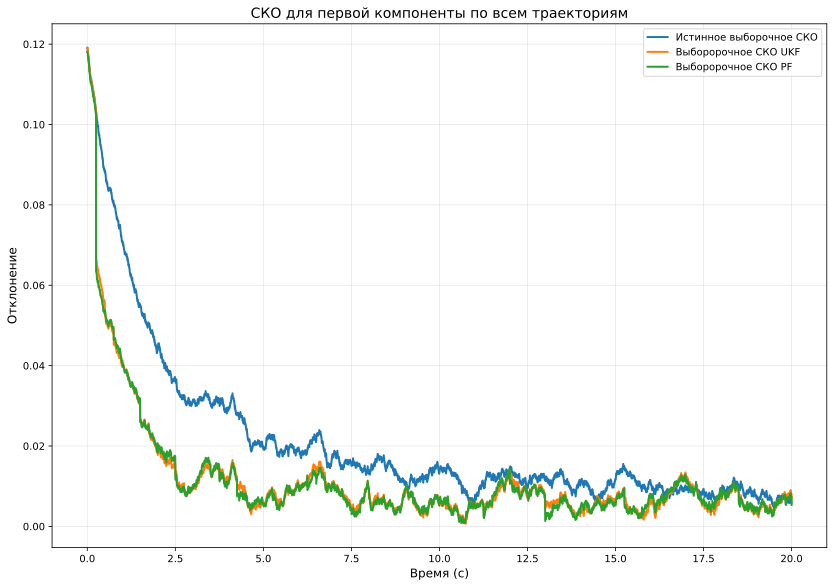

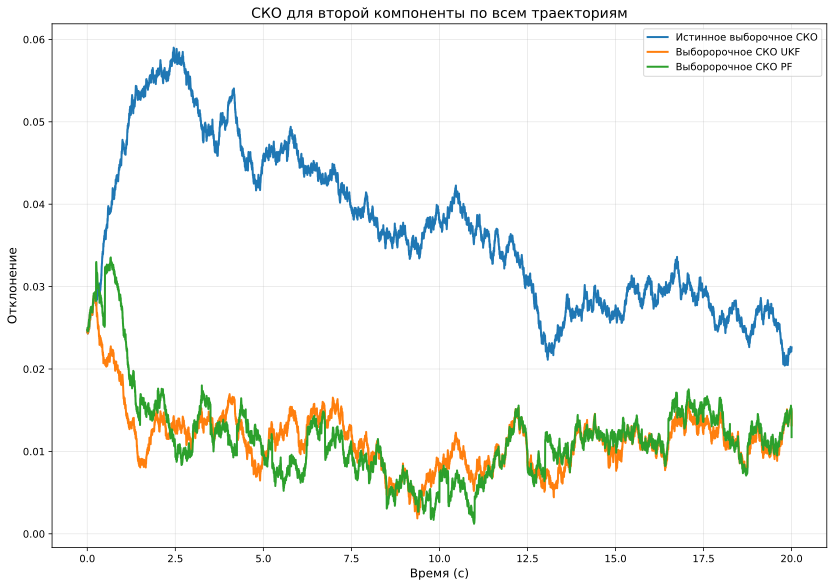

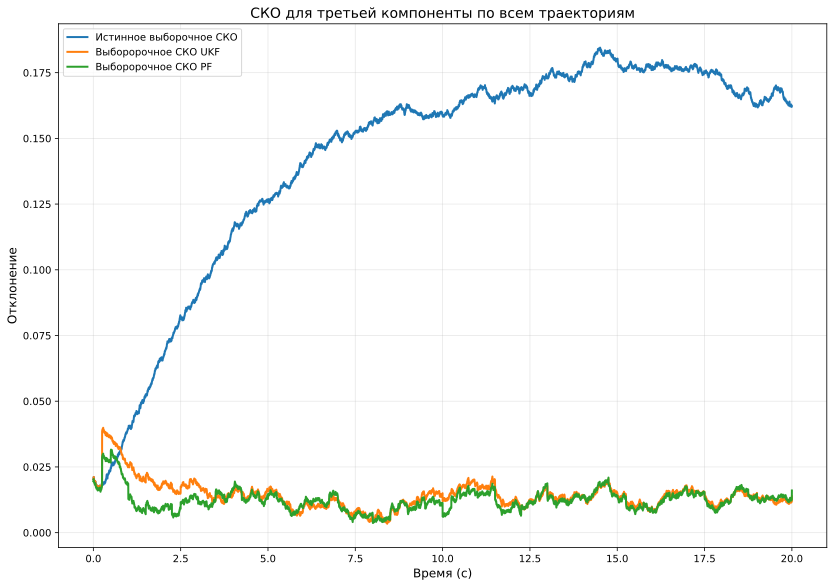

In [155]:
# Построение графика
plt.figure(figsize=(A4_WIDTH, A4_HEIGHT), dpi=DPI)

plt.plot(time, true_std[:,0],label = 'Истинное выборочное СКО', alpha=1, linewidth=2)
plt.plot(time, ukf_std[:,0],label = 'Выборорочное СКО UKF', alpha=1, linewidth=2)
plt.plot(time, pf_std[:,0],label = 'Выборорочное СКО PF', alpha=1, linewidth=2)

plt.xlabel('Время (с)', fontsize=12)
plt.ylabel('Отклонение', fontsize=12)
plt.title('СКО для первой компоненты по всем траекториям', fontsize=14)
plt.legend()
plt.grid(alpha=0.3)
#plt.ylim((-1,1))
plt.tight_layout()

# Сохранение в файл с высоким качеством
filename = '/content/drive/MyDrive/Colab Results/std_all_cA.png'
plt.savefig(filename, dpi=DPI, bbox_inches='tight', facecolor='white', edgecolor='none')
print(f'График сохранён как {filename}')

plt.figure(figsize=(A4_WIDTH, A4_HEIGHT), dpi=DPI)

plt.plot(time, true_std[:,1],label = 'Истинное выборочное СКО', alpha=1, linewidth=2)
plt.plot(time, ukf_std[:,1],label = 'Выборорочное СКО UKF', alpha=1, linewidth=2)
plt.plot(time, pf_std[:,1],label = 'Выборорочное СКО PF', alpha=1, linewidth=2)

plt.xlabel('Время (с)', fontsize=12)
plt.ylabel('Отклонение', fontsize=12)
plt.title('СКО для второй компоненты по всем траекториям', fontsize=14)
plt.legend()
plt.grid(alpha=0.3)
#plt.ylim((-1,1))
plt.tight_layout()

# Сохранение в файл с высоким качеством
filename = '/content/drive/MyDrive/Colab Results/std_all_cB.png'
plt.savefig(filename, dpi=DPI, bbox_inches='tight', facecolor='white', edgecolor='none')
print(f'График сохранён как {filename}')


plt.figure(figsize=(A4_WIDTH, A4_HEIGHT), dpi=DPI)

plt.plot(time, true_std[:,2],label = 'Истинное выборочное СКО', alpha=1, linewidth=2)
plt.plot(time, ukf_std[:,2],label = 'Выборорочное СКО UKF', alpha=1, linewidth=2)
plt.plot(time, pf_std[:,2],label = 'Выборорочное СКО PF', alpha=1, linewidth=2)

plt.xlabel('Время (с)', fontsize=12)
plt.ylabel('Отклонение', fontsize=12)
plt.title('СКО для третьей компоненты по всем траекториям', fontsize=14)
plt.legend()
plt.grid(alpha=0.3)
#plt.ylim((-1,1))
plt.tight_layout()

# Сохранение в файл с высоким качеством
filename = '/content/drive/MyDrive/Colab Results/std_all_cC.png'
plt.savefig(filename, dpi=DPI, bbox_inches='tight', facecolor='white', edgecolor='none')
print(f'График сохранён как {filename}')

plt.show()

График сохранён как /content/drive/MyDrive/Colab Results/std_mask_cA.png
График сохранён как /content/drive/MyDrive/Colab Results/std_mask_cB.png
График сохранён как /content/drive/MyDrive/Colab Results/std_mask_cC.png


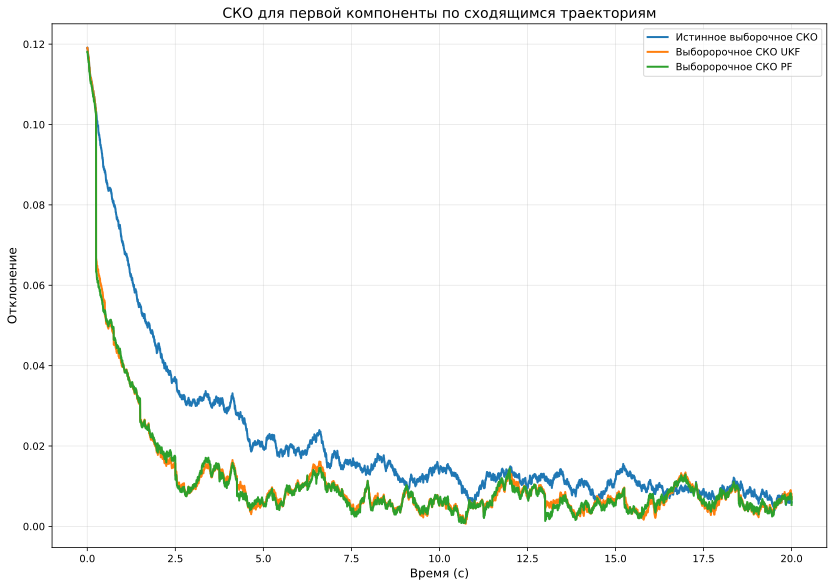

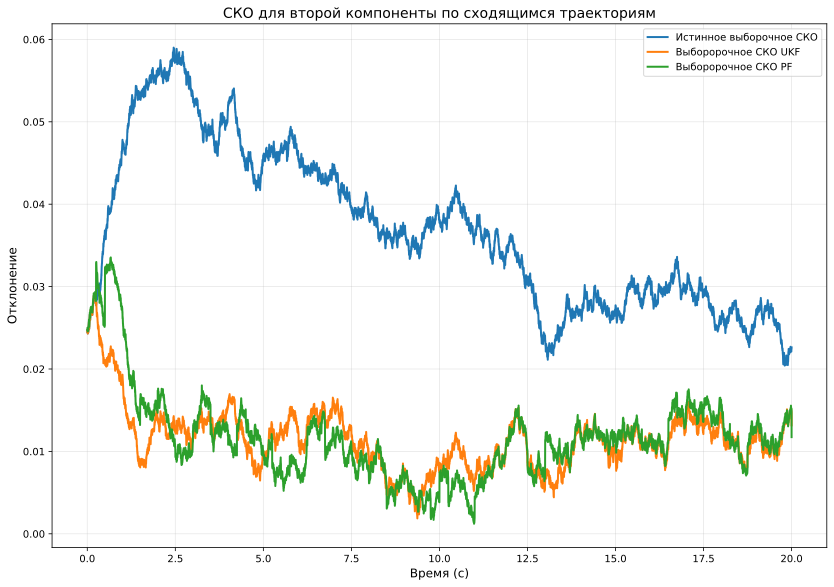

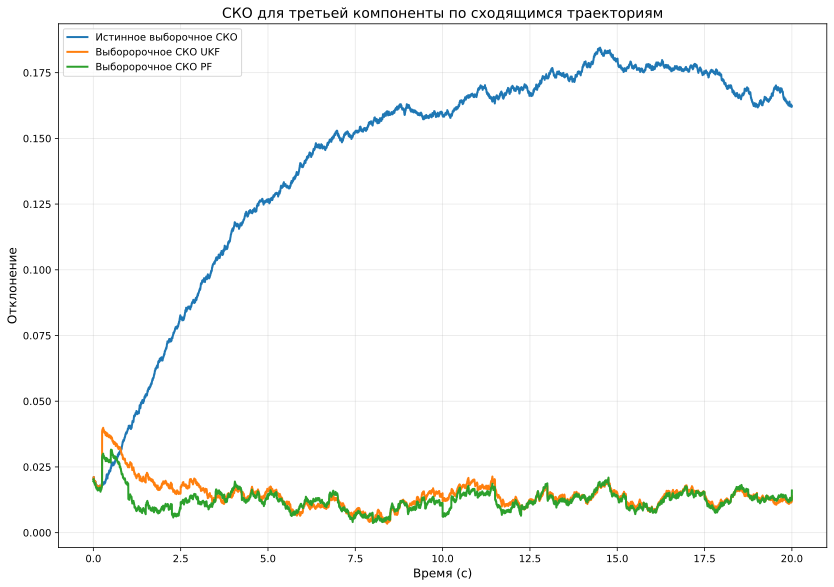

In [156]:
time = np.linspace(0, T_total, int(T_total/delta2)+1)
# Построение графика
plt.figure(figsize=(A4_WIDTH, A4_HEIGHT), dpi=DPI)

plt.plot(time, true_std[:,0],label = 'Истинное выборочное СКО', alpha=1, linewidth=2)
plt.plot(time, ukf_std[:,0],label = 'Выборорочное СКО UKF', alpha=1, linewidth=2)
plt.plot(time, pf_std_mask[:,0],label = 'Выборорочное СКО PF', alpha=1, linewidth=2)

plt.xlabel('Время (с)', fontsize=12)
plt.ylabel('Отклонение', fontsize=12)
plt.title('СКО для первой компоненты по сходящимся траекториям', fontsize=14)
plt.legend()
plt.grid(alpha=0.3)
#plt.ylim((-1,1))
plt.tight_layout()

# Сохранение в файл с высоким качеством
filename = '/content/drive/MyDrive/Colab Results/std_mask_cA.png'
plt.savefig(filename, dpi=DPI, bbox_inches='tight', facecolor='white', edgecolor='none')
print(f'График сохранён как {filename}')


plt.figure(figsize=(A4_WIDTH, A4_HEIGHT), dpi=DPI)

plt.plot(time, true_std[:,1],label = 'Истинное выборочное СКО', alpha=1, linewidth=2)
plt.plot(time, ukf_std[:,1],label = 'Выборорочное СКО UKF', alpha=1, linewidth=2)
plt.plot(time, pf_std_mask[:,1],label = 'Выборорочное СКО PF', alpha=1, linewidth=2)

plt.xlabel('Время (с)', fontsize=12)
plt.ylabel('Отклонение', fontsize=12)
plt.title('СКО для второй компоненты по сходящимся траекториям', fontsize=14)
plt.legend()
plt.grid(alpha=0.3)
#plt.ylim((-1,1))
plt.tight_layout()

# Сохранение в файл с высоким качеством
filename = '/content/drive/MyDrive/Colab Results/std_mask_cB.png'
plt.savefig(filename, dpi=DPI, bbox_inches='tight', facecolor='white', edgecolor='none')
print(f'График сохранён как {filename}')



plt.figure(figsize=(A4_WIDTH, A4_HEIGHT), dpi=DPI)

plt.plot(time, true_std[:,2],label = 'Истинное выборочное СКО', alpha=1, linewidth=2)
plt.plot(time, ukf_std[:,2],label = 'Выборорочное СКО UKF', alpha=1, linewidth=2)
plt.plot(time, pf_std_mask[:,2],label = 'Выборорочное СКО PF', alpha=1, linewidth=2)

plt.xlabel('Время (с)', fontsize=12)
plt.ylabel('Отклонение', fontsize=12)
plt.title('СКО для третьей компоненты по сходящимся траекториям', fontsize=14)
plt.legend()
plt.grid(alpha=0.3)
#plt.ylim((-1,1))
plt.tight_layout()

# Сохранение в файл с высоким качеством
filename = '/content/drive/MyDrive/Colab Results/std_mask_cC.png'
plt.savefig(filename, dpi=DPI, bbox_inches='tight', facecolor='white', edgecolor='none')
print(f'График сохранён как {filename}')

plt.show()